In [50]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt

import plotly.graph_objects as go
from mpl_toolkits.mplot3d import Axes3D

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings('ignore')


In [2]:
train = pd.read_csv("/home/hasan/Data Set/Kannada-MNIST/train.csv")
test = pd.read_csv("/home/hasan/Data Set/Kannada-MNIST/test.csv")
digit_mnist = pd.read_csv("/home/hasan/Data Set/Kannada-MNIST/Dig-MNIST.csv")
sample_submission =pd.read_csv("/home/hasan/Data Set/Kannada-MNIST/sample_submission.csv")

### Train Dataset

In [3]:
train.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
train.shape

(60000, 785)

In [5]:
train.label.value_counts()

9    6000
8    6000
7    6000
6    6000
5    6000
4    6000
3    6000
2    6000
1    6000
0    6000
Name: label, dtype: int64

### Visualizing some Image

<ipython-input-29-e5c9e24a6209>:10: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  fig.add_subplot(rows, columns, i + 1)


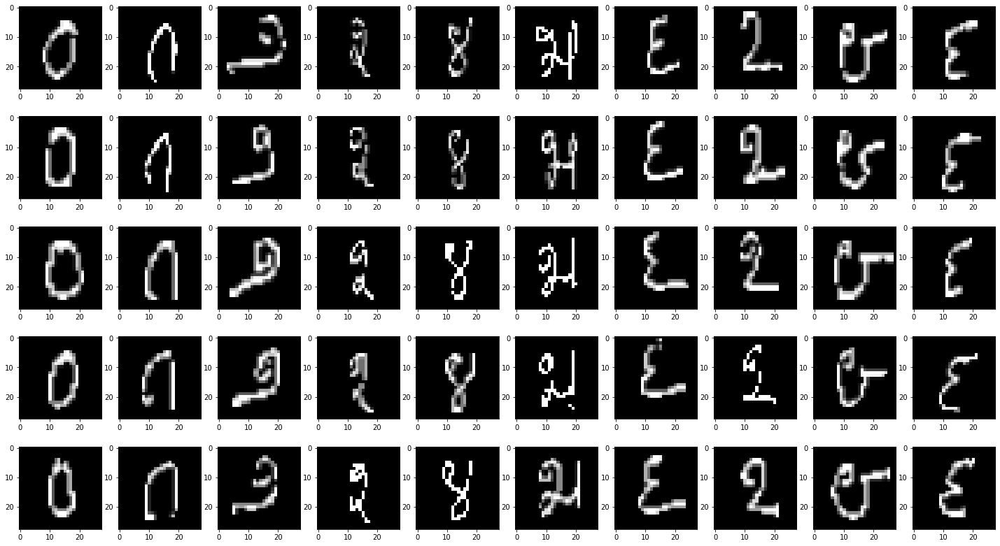

In [29]:
pictures = train.iloc[0:50, 1:]
pictures_count = pictures.shape[0]

fig = plt.figure(figsize=(25, 14))
columns = 10

rows = np.ceil(pictures_count / columns)
for i, row in pictures.iterrows():
    img = row.values.reshape((28, 28))
    fig.add_subplot(rows, columns, i + 1)
    plt.imshow(img, cmap="gray")
plt.show()


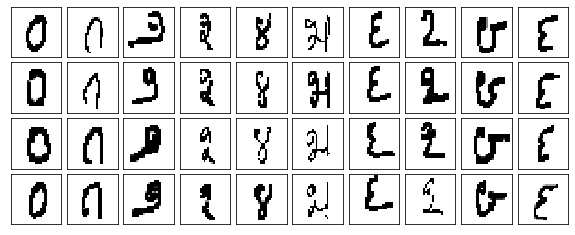

In [30]:
def plot_digits(data):
    fig, axes = plt.subplots(4, 10, figsize=(10, 4),
                             subplot_kw={'xticks':[], 'yticks':[]},
                             gridspec_kw=dict(hspace=0.1, wspace=0.1))
    for i, ax in enumerate(axes.flat):
        ax.imshow(data[i].reshape(28, 28),
                  cmap='binary', interpolation='nearest',
                  clim=(0, 16))

x = train.iloc[:, 1:].values        
plot_digits(x)


### t-SNE Visualization

In [34]:
x = train.iloc[:, 1:].values
y = train.iloc[:, 0].values

In [35]:
x_subset = x[0: 10000]
y_subset = y[0: 10000]
print(f"Shape of x_subset is {x_subset.shape} Shape of y_subset is {y_subset.shape}")


Shape of x_subset is (10000, 784) Shape of y_subset is (10000,)


In [38]:
tsne = TSNE(random_state = 42, n_components=2,verbose=0, perplexity=40, n_iter=300).fit_transform(x_subset)

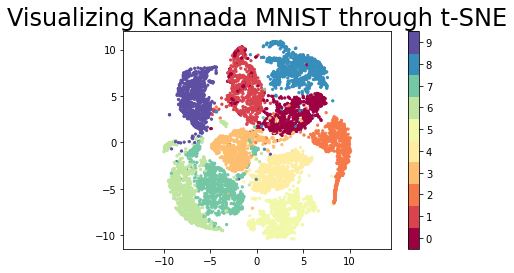

In [39]:
plt.scatter(tsne[:, 0], tsne[:, 1], s= 5, c=y_subset, cmap='Spectral')
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.title('Visualizing Kannada MNIST through t-SNE', fontsize=24);


### t-SNE Visualization and Apply PCA

In [44]:
pca = PCA(n_components=50)
pca_result = pca.fit_transform(x_subset)

In [46]:
pca_tsne = TSNE(random_state = 42, n_components=2, verbose=0, perplexity=40, n_iter=300).fit_transform(pca_result)

Text(0.5, 1.0, 'Visualizing Kannada MNIST through t-SNE')

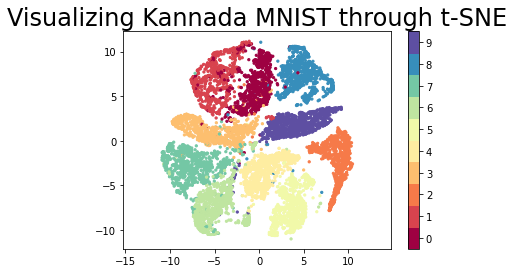

In [47]:
plt.scatter(pca_tsne[:, 0], pca_tsne[:, 1], s= 5, c=y_subset, cmap='Spectral')
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.title('Visualizing Kannada MNIST through t-SNE', fontsize=24)

### t-SNE 3D Using Matplotlib

In [51]:
pca_tsne2 = TSNE(random_state = 42, n_components=3, verbose=0, perplexity=40, n_iter=300).fit_transform(pca_result)

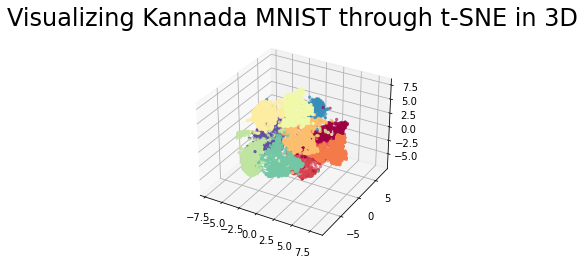

In [52]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter(pca_tsne2[:, 0], pca_tsne2[:, 1],pca_tsne2[:,2], s= 5, c=y_subset, cmap='Spectral')
plt.title('Visualizing Kannada MNIST through t-SNE in 3D', fontsize=24);
plt.show()

### t-SNE 3D Using Plotly

In [ ]:
pca_tsne2 = TSNE(random_state = 42, n_components=3, verbose=0, perplexity=40, n_iter=300).fit_transform(pca_result)

In [53]:
x=pca_tsne2[:, 0]
y=pca_tsne2[:, 1]
z=pca_tsne2[:, 2]

fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
        size=12,
        color=x,                # set color to an array/list of desired values
        colorscale='Spectral',   # choose a colorscale
        opacity=0.8
    )
)])

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

In [54]:
x=pca_tsne2[:, 0]
y=pca_tsne2[:, 1]
z=pca_tsne2[:, 2]

fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(size=3, symbol="circle"),
    )
])

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

### Using Bokeh to visualize t-SNE

In [58]:
from io import BytesIO
from PIL import Image
import base64

from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource, CategoricalColorMapper
from bokeh.palettes import Spectral10

output_notebook()



Loading BokehJS ...

In [59]:
def embeddable_image(data):
    img_data = 255 - 15 * data.astype(np.uint8)
    image = Image.fromarray(img_data, mode='L').resize((28,28), Image.BICUBIC)
    buffer = BytesIO()
    image.save(buffer, format='png')
    for_encoding = buffer.getvalue()
    return 'data:image/png;base64,' + base64.b64encode(for_encoding).decode()


In [60]:
x_subset_reshape = x_subset.reshape(-1,28,28)

digits_df = pd.DataFrame(pca_tsne, columns=('x', 'y'))
digits_df['digit'] = [str(x) for x in y_subset]
digits_df['image'] = list(map(embeddable_image, x_subset_reshape))


datasource = ColumnDataSource(digits_df)
color_mapping = CategoricalColorMapper(factors=[str(9 - x) for x in y_subset],
                                       palette=Spectral10)

plot_figure = figure(
    title='t-SNE projection of the Kannada MNIST dataset',
    plot_width=600,
    plot_height=600,
    tools=('pan, wheel_zoom, reset')
)

plot_figure.add_tools(HoverTool(tooltips="""
<div>
    <div>
        <img src='@image' style='float: left; margin: 5px 5px 5px 5px'/>
    </div>
    <div>
        <span style='font-size: 16px; color: #224499'>Digit:</span>
        <span style='font-size: 18px'>@digit</span>
    </div>
</div>
"""))

plot_figure.circle(
    'x',
    'y',
    source=datasource,
    color=dict(field='digit', transform=color_mapping),
    line_alpha=0.6,
    fill_alpha=0.6,
    size=4
)
show(plot_figure)

### Test Dataset

In [21]:
test.head()

,id,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [22]:
test.shape

(5000, 785)

### Some Visualization

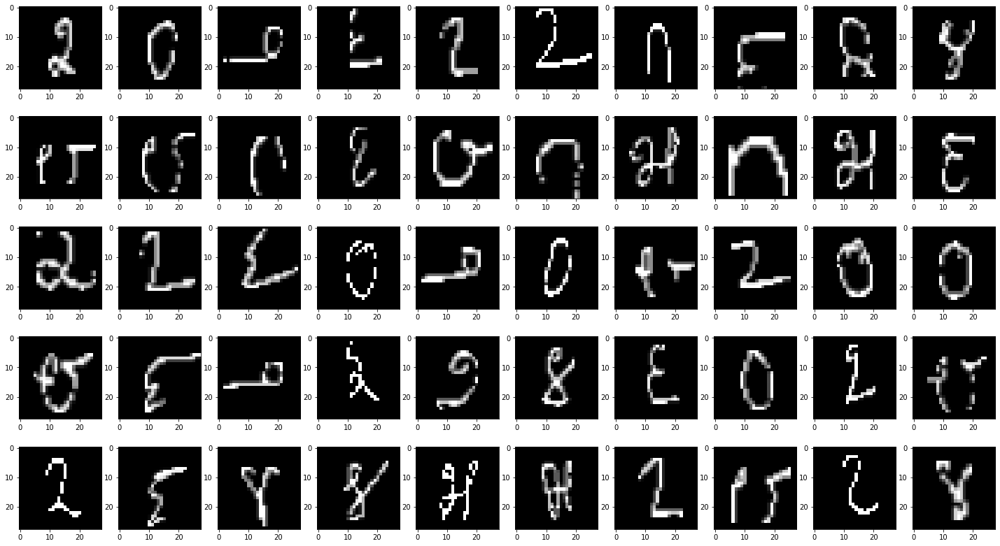

In [61]:
pictures = test.iloc[0:50, 1:]
pictures_count = pictures.shape[0]

fig = plt.figure(figsize=(25, 14))
columns = 10

rows = np.ceil(pictures_count / columns)
for i, row in pictures.iterrows():
    img = row.values.reshape((28, 28))
    fig.add_subplot(rows, columns, i + 1)
    plt.imshow(img, cmap="gray")
plt.show()

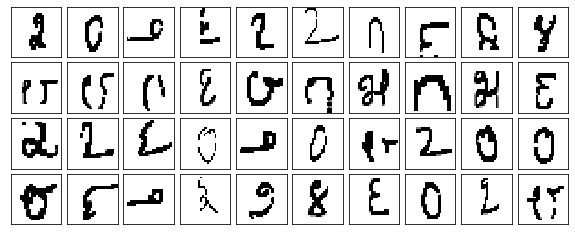

In [62]:
def plot_digits(data):
    fig, axes = plt.subplots(4, 10, figsize=(10, 4),
                             subplot_kw={'xticks':[], 'yticks':[]},
                             gridspec_kw=dict(hspace=0.1, wspace=0.1))
    for i, ax in enumerate(axes.flat):
        ax.imshow(data[i].reshape(28, 28),
                  cmap='binary', interpolation='nearest',
                  clim=(0, 16))

x = test.iloc[:, 1:].values        
plot_digits(x)


### Digit_mnist Dataset

In [23]:
digit_mnist.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [24]:
digit_mnist.shape

(10240, 785)

In [25]:
digit_mnist.label.value_counts()

7    1024
6    1024
5    1024
4    1024
3    1024
2    1024
9    1024
1    1024
8    1024
0    1024
Name: label, dtype: int64

### Some Visualization

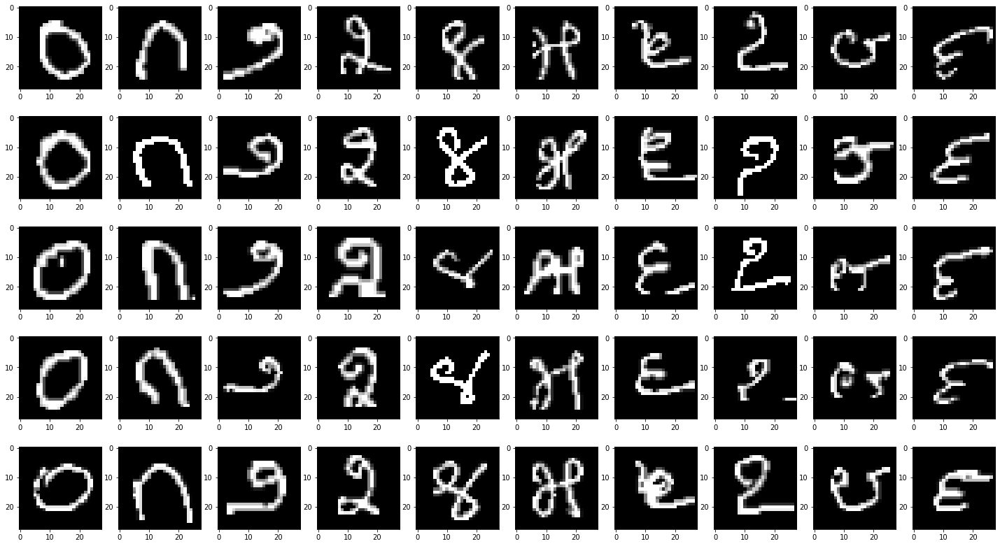

In [63]:
pictures = digit_mnist.iloc[0:50, 1:]
pictures_count = pictures.shape[0]

fig = plt.figure(figsize=(25, 14))
columns = 10

rows = np.ceil(pictures_count / columns)
for i, row in pictures.iterrows():
    img = row.values.reshape((28, 28))
    fig.add_subplot(rows, columns, i + 1)
    plt.imshow(img, cmap="gray")
plt.show()

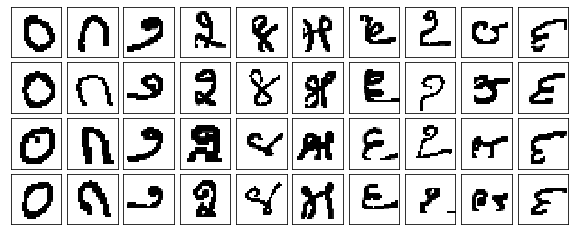

In [64]:
def plot_digits(data):
    fig, axes = plt.subplots(4, 10, figsize=(10, 4),
                             subplot_kw={'xticks':[], 'yticks':[]},
                             gridspec_kw=dict(hspace=0.1, wspace=0.1))
    for i, ax in enumerate(axes.flat):
        ax.imshow(data[i].reshape(28, 28),
                  cmap='binary', interpolation='nearest',
                  clim=(0, 16))

x = digit_mnist.iloc[:, 1:].values        
plot_digits(x)

### sample_submission

In [26]:
sample_submission.head()

,id,label
0,0,5
1,1,5
2,2,5
3,3,5
4,4,5


In [27]:
sample_submission.shape

(5000, 2)

In [28]:
sample_submission.label.value_counts()

5    5000
Name: label, dtype: int64